In [1]:
using LinearAlgebra
using Plots
# using Zygote
# using Roots
using LaTeXStrings
using Interpolations
using DataFrames
using CSV
using Printf
using LsqFit

In [3]:
# global constants...

const vF::Float64 = 1e8 # cm/s
const r_LA::Float64 = 0.021 # vS/vF
# note: in this code I use r = vS/vF and s = vD/vS

const L::Float64 = 13 # μm
const W::Float64 = 3 # μm
const ρ::Float64 = 7.63e-8 # g cm^-2 

const n_flavors::Int32 = 4

const ergs_per_eV::Float64 = 1.602e-12

const D::Float64 = 19 * ergs_per_eV # 19 eV, converted to ergs

const e_statC::Float64 = -4.80326e-10 # statC
const e_C::Float64 = -1.60217663e-19 # coulombs

const ħ_eV_s::Float64 = 6.582e-16 # eV*s
const kB_eV_K::Float64 = 8.617e-5 # eV/K

const cutoff_angle::Float64 = 2*π


# the device is 3 μm wide and 13 μm long.
# the contacts are 1 μm wide and there is 1 μm spacing between them,
# so the center-to-center distance is 2 μm.
# the centers of the contacts are, I think, 1.5, 3.5, 5.5, 7.5, 9.5, 11.5 μm.

6.283185307179586

In [4]:
function load_field_vals_2K(n,x)
    T_str = @sprintf("%1.2e",2.0)
    n_str = @sprintf("%1.2e",n)
    x_str = @sprintf("%1.2e",x)
    field_df = DataFrame(CSV.File("./field_vals_csv/D_19_eV/2K/" * replace("T="*T_str*"_n="*n_str*"_x="*x_str, "."=>"-") * ".csv"))
    return field_df
end

function load_field_vals_300K(n,x)
    T_str = @sprintf("%1.2e",300)
    n_str = @sprintf("%1.2e",n)
    x_str = @sprintf("%1.2e",x)
    field_df = DataFrame(CSV.File("./field_vals_csv/D_19_eV/300K/" * replace("T="*T_str*"_n="*n_str*"_x="*x_str, "."=>"-") * ".csv"))
    return field_df
end

load_field_vals_300K (generic function with 1 method)

### first, T = 2 K

In [5]:
x_vals_μm = 0.0:0.5:12.0 # μm
x_vals_m = collect(x_vals_μm) .* 1e-6 # meters

T::Float64 = 2.0 # K
n::Float64 = 1.4e12 # cm^-2


field_dfs = []
for x in x_vals_μm
    push!(field_dfs, load_field_vals_2K(n,x))
end

s_vals = field_dfs[1][:,1]

fields_matrix = hcat([df_x[:,2] for df_x in field_dfs]...)
# row corresponds to s, column corresponds to x

81×25 Matrix{Float64}:
    0.00254452     0.00228956      0.00205422  …  -0.00183315  -0.00205422
    0.0121006      0.0114736       0.0109021       0.00577379   0.00575736
    0.0248977      0.0237457       0.0226882       0.0135343    0.0135916
    0.0415735      0.039728        0.0380244       0.0228259    0.0229088
    0.0669065      0.0640422       0.0613807       0.0357452    0.0357164
    0.109665       0.105078        0.100783    …   0.0550752    0.0546334
    0.19198        0.184312        0.177072        0.0922218    0.0907551
    0.377608       0.364059        0.351162        0.186034     0.182184
    0.899946       0.873224        0.847531        0.483312     0.472705
    2.72082        2.66905         2.6187          1.8176       1.7897
    ⋮                                          ⋱               
 3025.35        6624.82        14998.7             2.80926e12   7.13394e12
 3083.08        6838.88        15704.0             4.11269e12   1.0613e13
 3141.17        7060.07    

In [6]:
function trapezoid(x_vals, y_vals)
    N = size(x_vals,1)
    sum = 0.0
    for k=2:N
        area = (x_vals[k] - x_vals[k-1]) * (y_vals[k] + y_vals[k-1]) * 0.5
        sum += area
    end
    return sum
end


function voltages(x_vals, fields_matrix)
    N = size(fields_matrix,1)
    voltages = Float64[]

    for k=1:N
        fields = fields_matrix[k,:]
        push!(voltages, trapezoid(x_vals,fields))
    end

    return voltages 
end

function voltage_matrix(x_vals, fields_matrix)
    n_rows, n_cols = size(fields_matrix)
    V_matrix = similar(fields_matrix)
    for k=1:n_rows
        fields = fields_matrix[k,:]
        for l=1:n_cols
            V_matrix[k,l] = trapezoid(x_vals[1:l],fields[1:l])
        end
    end
    return V_matrix
end

voltage_matrix (generic function with 1 method)

In [7]:
Vs = voltage_matrix(x_vals_m, fields_matrix)

81×25 Matrix{Float64}:
 0.0  1.20852e-9  2.29446e-9  …  4.13044e-9  3.26631e-9  2.29446e-9
 0.0  5.89353e-9  1.14874e-8     8.70842e-8  8.99797e-8  9.28624e-8
 0.0  1.21608e-8  2.37693e-8     1.88933e-7  1.95698e-7  2.02479e-7
 0.0  2.03254e-8  3.97634e-8     3.185e-7    3.29911e-7  3.41345e-7
 0.0  3.27372e-8  6.40929e-8     5.12744e-7  5.30652e-7  5.48518e-7
 0.0  5.36859e-8  1.05151e-7  …  8.31932e-7  8.59621e-7  8.87048e-7
 0.0  9.4073e-8   1.84419e-7     1.45547e-6  1.50201e-6  1.54775e-6
 0.0  1.85417e-7  3.64222e-7     2.9383e-6   3.03236e-6  3.12442e-6
 0.0  4.43292e-7  8.73481e-7     7.35965e-6  7.6041e-6   7.8431e-6
 0.0  1.34747e-6  2.66941e-6     2.46597e-5  2.55757e-5  2.64775e-5
 ⋮                            ⋱                          
 0.0  0.00241254  0.00781842     6.37968e5   1.61709e6   4.10289e6
 0.0  0.00248049  0.00811621     9.05494e5   2.33245e6   6.01388e6
 0.0  0.00255031  0.00842708     1.28692e6   3.36881e6   8.82704e6
 0.0  0.00262156  0.00874858  …  1.8312

In [8]:
plot_indices = 8:18

8:18

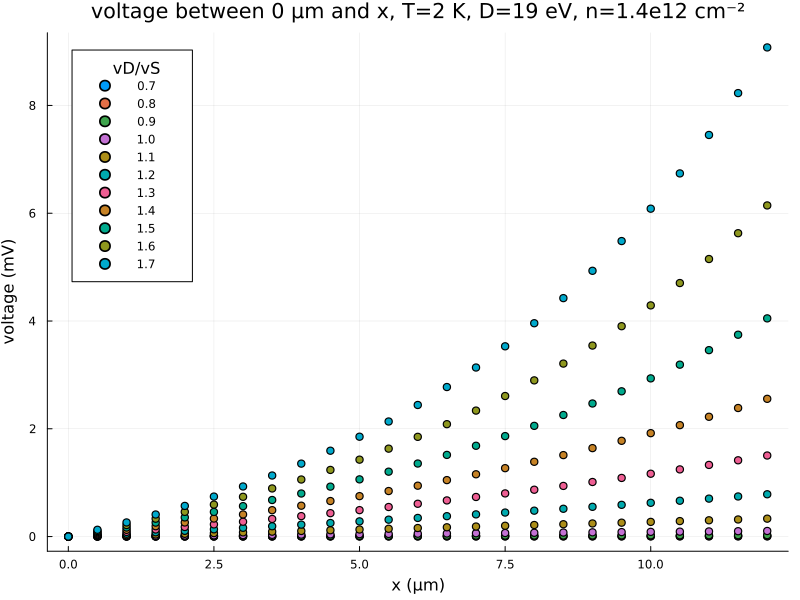

In [10]:
p1 = scatter(x_vals_μm, ([eachrow(Vs)...].*1000)[plot_indices], labels=hcat(s_vals[plot_indices]...))
p1 = plot!(xlabel = "x (μm)", ylabel = "voltage (mV)", title = "voltage between 0 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", legendtitle="vD/vS")
p1 = plot!(size=(800,600))

In [11]:
savefig(p1, "./figs/D_19_eV/2K/voltage_vs_x.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\voltage_vs_x.png"

In [12]:
function drift_velocity_to_current(n,s)
    # n in cm^-2, vD in cm/s
    # returns current in amperes
    vD = r_LA*s*vF
    width_in_cm = W * 1e-4
    return n * width_in_cm * e_C * vD
end

drift_velocity_to_current (generic function with 1 method)

In [13]:
currents = Float64[]
for s in s_vals
    push!(currents, abs(drift_velocity_to_current(n, s)))
end

In [14]:
function resistance_matrix(voltage_matrix, currents)
    R_matrix = similar(voltage_matrix)
    for (i, V_row) in enumerate(eachrow(voltage_matrix))
        R_matrix[i,:] = V_row ./ currents[i]
    end
    return R_matrix
end

resistance_matrix (generic function with 1 method)

In [15]:
Rs = resistance_matrix(Vs, currents)

81×25 Matrix{Float64}:
 NaN    Inf           Inf           Inf          …  Inf          Inf
   0.0   0.000417058   0.000812913   0.00118938      0.00636745   0.00657145
   0.0   0.000430283   0.000841022   0.00123378      0.00692432   0.00716426
   0.0   0.000479444   0.000937959   0.00137712      0.00778211   0.00805181
   0.0   0.000579165   0.00113389    0.00166588      0.00938795   0.00970402
   0.0   0.00075982    0.00148821    0.00218714  …   0.0121663    0.0125545
   0.0   0.00110952    0.00217508    0.00319911      0.017715     0.0182545
   0.0   0.00187444    0.00368205    0.005426        0.0306552    0.0315858
   0.0   0.00392122    0.00772653    0.0114204       0.0672634    0.0693775
   0.0   0.0105949     0.0209891     0.031188        0.201097     0.208188
   ⋮                                             ⋱               
   0.0   2.37117       7.68436      19.92            1.58937e9    4.03254e9
   0.0   2.40456       7.86776      20.636           2.26105e9    5.82979e9
   

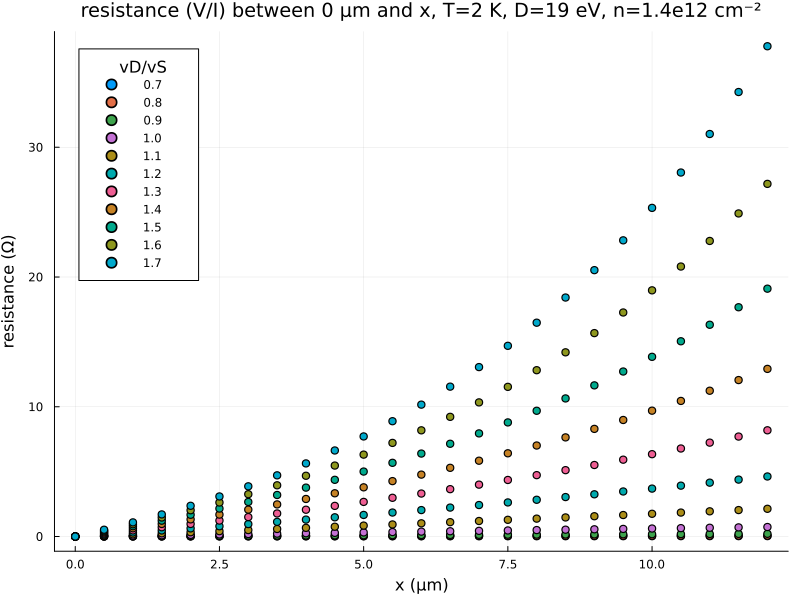

In [16]:
p2 = scatter(x_vals_μm, ([eachrow(Rs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))
p2 = plot!(xlabel = "x (μm)", ylabel = "resistance (Ω)", title = "resistance (V/I) between 0 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
p2 = plot!(size=(800,600))

In [17]:
function differential_resistivity(voltage_vals, current_vals)
    # voltage_vals and current_vals are both arrays whose index corresponds to s
    derivatives = zeros(Float64, size(current_vals,1))
    for i in eachindex(current_vals)
        if i==1 || i==size(current_vals,1)
            derivatives[i] = NaN
        else
            derivatives[i] = ((voltage_vals[i+1]-voltage_vals[i])/(current_vals[i+1]-current_vals[i]) + (voltage_vals[i]-voltage_vals[i-1])/(current_vals[i]-current_vals[i-1])) / 2.0
        end
    end
    return derivatives
end

function differential_resistivity_matrix(voltage_matrix, current_vals)
    dVdI_matrix = similar(voltage_matrix)
    for (j, V_col) in enumerate(eachcol(voltage_matrix)) # so, each column corresponds to a given x value
        dVdI_matrix[:,j] = differential_resistivity(V_col, current_vals)
    end
    return dVdI_matrix
end

differential_resistivity_matrix (generic function with 1 method)

In [18]:
dVdIs = differential_resistivity_matrix(Vs, currents)

81×25 Matrix{Float64}:
 NaN    NaN            NaN            …  NaN           NaN
   0.0    0.000387523    0.000759838       0.00680874    0.00708308
   0.0    0.000510637    0.00100048        0.00848944    0.00879199
   0.0    0.000728047    0.00142676        0.0118516     0.0122438
   0.0    0.00118038     0.00231359        0.0187426     0.0193085
   0.0    0.00217022     0.00425746   …    0.0343691     0.0353555
   0.0    0.004661       0.00916663        0.0768774     0.0791641
   0.0    0.0123563      0.0243809         0.215908      0.222746
   0.0    0.0411165      0.0815637         0.797645      0.826297
   0.0    0.145748       0.291068          3.24943       3.38611
   ⋮                                  ⋱                
   0.0    4.77187       20.7945            4.28265e10    1.13659e11
   0.0    4.87465       21.5362            6.19806e10    1.67153e11
   0.0    4.99122       22.3752            8.98479e10    2.46234e11
   0.0    5.09056       23.1151       …    1.30199e11    

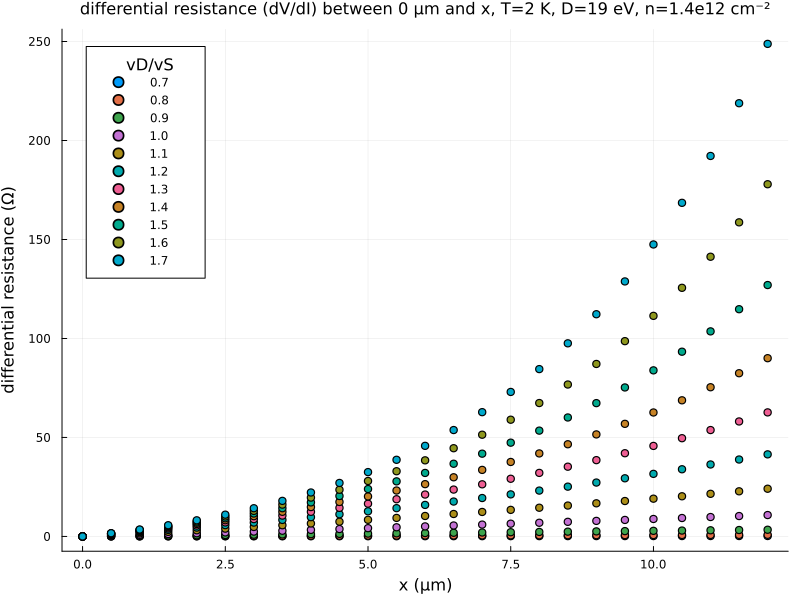

In [19]:
p3 = scatter(x_vals_μm, ([eachrow(dVdIs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))
p3 = plot!(xlabel = "x (μm)", ylabel = "differential resistance (Ω)", title = "differential resistance (dV/dI) between 0 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=11, legendtitle="vD/vS")
p3 = plot!(size=(800,600))

adding exponential fits to T = 2 K plots

we fit the data for $R$ and $\mathrm{d}V/\mathrm{d}I$ to the function

<!-- $$ y = a \times ( \exp[b(x-1.5)] - 1 ) $$ -->
$$ y = a \times ( \exp[bx)] - 1 ) $$

<!-- where $y$ is resistance or differential resistance, $x$ is the distance in μm, and we subtract 1.5 μm since the voltage is measured relative to the first contact -->
where $y$ is resistance or differential resistance, $x$ is the distance in μm

In [22]:
# model(x,p) = p[1] * (exp.(p[2]*(x.-1.5)) .- 1) # x in μm
model(x,p) = p[1] * (exp.(p[2]*x) .- 1) # x in μm

model (generic function with 1 method)

In [28]:
R_fit_params = Matrix{Float64}(undef,0,2)
R_fit_stdev = Matrix{Float64}(undef,0,2)
for (i,row) in enumerate(eachrow(Rs))
    if isnan(row[1])
        R_fit_params = vcat(R_fit_params, [NaN,NaN]')
        R_fit_stdev = vcat(R_fit_stdev, [NaN,NaN]')
        continue
    end
    fit = curve_fit(model, x_vals_μm, row, [100.0, 3.0])
    R_fit_params = vcat(R_fit_params, fit.param')
    R_fit_stdev = vcat(R_fit_stdev, standard_errors(fit)')
end

In [29]:
dVdI_fit_params = Matrix{Float64}(undef,0,2)
dVdI_fit_stdev = Matrix{Float64}(undef,0,2)
for (i,row) in enumerate(eachrow(dVdIs))
    if isnan(row[1])
        dVdI_fit_params = vcat(dVdI_fit_params, [NaN,NaN]')
        dVdI_fit_stdev = vcat(dVdI_fit_stdev, [NaN,NaN]')
        continue
    end
    fit = curve_fit(model, x_vals_μm, row, [100.0, 3.0])
    dVdI_fit_params = vcat(dVdI_fit_params, fit.param')
    dVdI_fit_stdev = vcat(dVdI_fit_stdev, standard_errors(fit)')
end

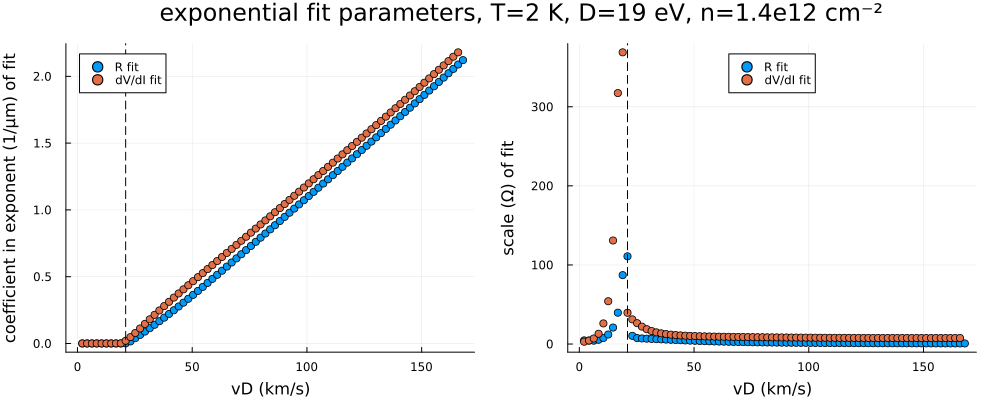

In [30]:
p4 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,2], label = "R fit")
p4 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,2], label = "dV/dI fit")
p4 = vline!([21], linestyle=:dash, color=:black, label=:none)
p4 = plot!(xlabel="vD (km/s)", ylabel="coefficient in exponent (1/μm) of fit")
p4 = plot!(legend=:topleft)

p5 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,1], label = "R fit")
p5 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,1], label = "dV/dI fit")
p5 = vline!([21], linestyle=:dash, color=:black, label=:none)
p5 = plot!(xlabel="vD (km/s)", ylabel="scale (Ω) of fit")
p5 = plot!(legend=:top)

p6 = plot(p4, p5, layout = 2)
p6 = plot!(plot_title="exponential fit parameters, T=2 K, D=19 eV, n=1.4e12 cm⁻²")
p6 = plot!(size=(1000,400), margin=4*Plots.mm)

In [31]:
savefig(p6, "./figs/D_19_eV/2K/fit_params.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\fit_params.png"

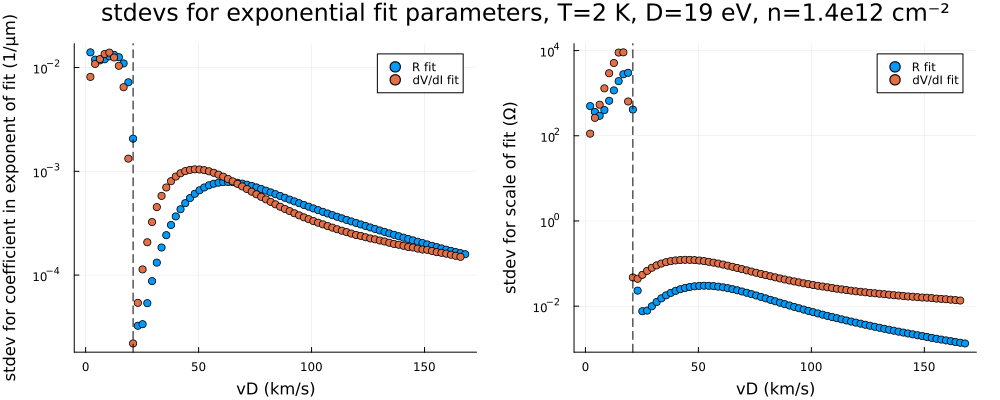

In [32]:
p7 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_stdev[:,2], label = "R fit")
p7 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_stdev[:,2], label = "dV/dI fit")
p7 = vline!([21], linestyle=:dash, color=:black, label=:none)
p7 = plot!(yaxis=:log)
p7 = plot!(xlabel="vD (km/s)", ylabel="stdev for coefficient in exponent of fit (1/μm)")

p8 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_stdev[:,1], label = "R fit")
p8 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_stdev[:,1], label = "dV/dI fit")
p8 = vline!([21], linestyle=:dash, color=:black, label=:none)
p8 = plot!(yaxis=:log)
p8 = plot!(xlabel="vD (km/s)", ylabel="stdev for scale of fit (Ω)")

p9 = plot(p7, p8, layout = 2)
p9 = plot!(plot_title="stdevs for exponential fit parameters, T=2 K, D=19 eV, n=1.4e12 cm⁻²")
p9 = plot!(size=(1000,400), margin=4*Plots.mm)

In [33]:
savefig(p9, "./figs/D_19_eV/2K/fit_stdevs.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\fit_stdevs.png"

In [34]:
x_finer_grid_μm = range(x_vals_μm[1], x_vals_μm[end], length=1000)

0.0:0.012012012012012012:12.0

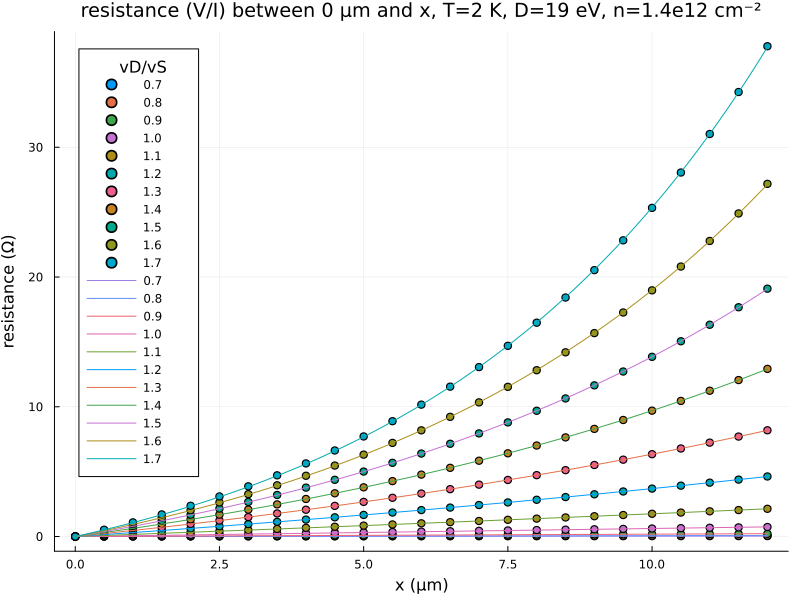

In [35]:
p10 = scatter(x_vals_μm, ([eachrow(Rs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

p10 = plot!(x_finer_grid_μm, [x -> model(x, R_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

p10 = plot!(xlabel = "x (μm)", ylabel = "resistance (Ω)", title = "resistance (V/I) between 0 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
p10 = plot!(size=(800,600))

In [36]:
savefig(p10, "./figs/D_19_eV/2K/resistance_vs_x_with_fit.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\resistance_vs_x_with_fit.png"

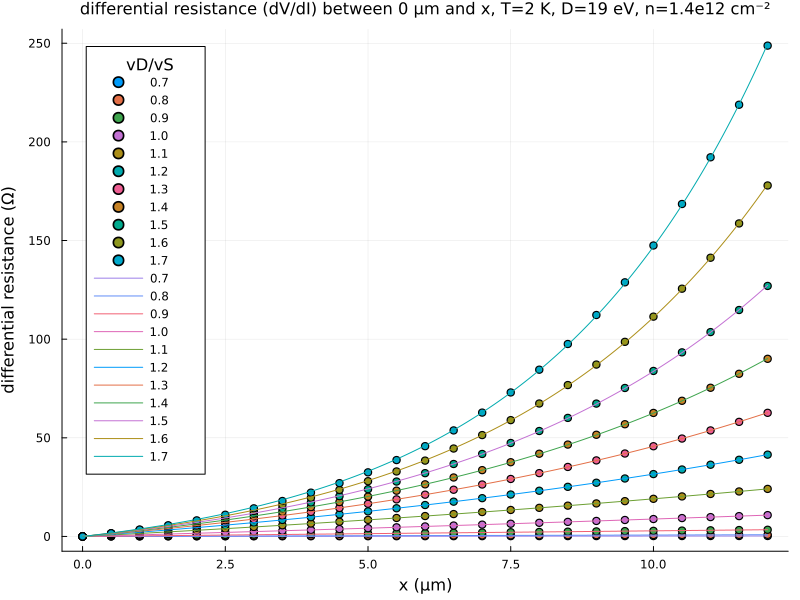

In [37]:
p11 = scatter(x_vals_μm, ([eachrow(dVdIs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

p11 = plot!(x_finer_grid_μm, [x -> model(x, dVdI_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

p11 = plot!(xlabel = "x (μm)", ylabel = "differential resistance (Ω)", title = "differential resistance (dV/dI) between 0 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=11, legendtitle="vD/vS")
p11 = plot!(size=(800,600))

In [38]:
savefig(p11, "./figs/D_19_eV/2K/dVdI_vs_x_with_fit.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\dVdI_vs_x_with_fit.png"

now we add the plot of $\max \Gamma^{\textrm{amp}}_{\bf q} / v_\textrm{s}$

In [39]:
function load_γs_df_2K(n,s)
    T = 2.0
    T_str = @sprintf("%1.2e",T)
    n_str = @sprintf("%1.2e",n)
    s_str = @sprintf("%1.2e",s)
    return DataFrame(CSV.File("./amp_rates_csv/D_19_eV/2K/" * replace("T="*T_str*"_n="*n_str*"_s="*s_str, "."=>"-") * ".csv"))
end

load_γs_df_2K (generic function with 1 method)

In [40]:
function max_Gamma_amp_over_vs_2K(s)
    γs_df = load_γs_df_2K(n,s)
    Γamps = γs_df."Γamp"
    max_Γamp = maximum(Γamps) # this is in 1/s
    vS = r_LA*vF # this is in cm/s
    # max_Γamp / vS would be in 1/cm, so we need to multiply by 1 cm / 10^4 μm to get to 1/μm.
    return (max_Γamp / vS) * 1e-4
end

max_Gamma_amp_over_vs_2K (generic function with 1 method)

In [41]:
expected_exponents = [max_Gamma_amp_over_vs_2K(s) for s in s_vals]

81-element Vector{Float64}:
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
  ⋮
  1.90914722933382
  1.9406251379544854
  1.9720757785794225
  2.003495641165548
  2.0348810891255495
  2.0662283541692363
  2.097533530484923
  2.128792568127457
  2.160001267150903

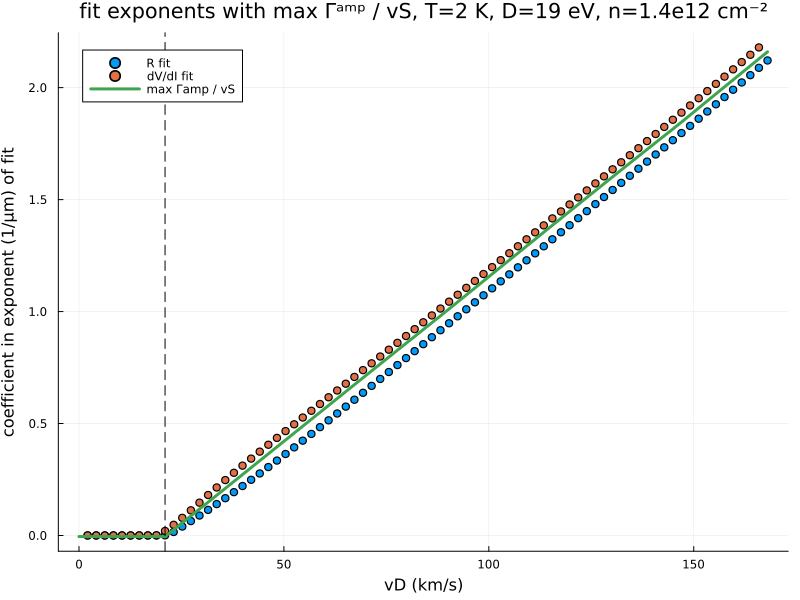

In [42]:
p12 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,2], label = "R fit")
p12 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,2], label = "dV/dI fit")
p12 = plot!(s_vals.*(r_LA*vF*1e-5), expected_exponents, label = "max Γamp / vS", linewidth=3)
p12 = vline!([21], linestyle=:dash, color=:black, label=:none)
p12 = plot!(xlabel="vD (km/s)", ylabel="coefficient in exponent (1/μm) of fit")
p12 = plot!(title="fit exponents with max Γᵃᵐᵖ / vS, T=2 K, D=19 eV, n=1.4e12 cm⁻²", legend=:topleft)
p12 = plot!(size=(800,600))

In [43]:
savefig(p12, "./figs/D_19_eV/2K/fit_exponent_with_expectation.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\2K\\fit_exponent_with_expectation.png"

<!-- alternative fitting method:

instead of fitting $\mathrm{d}V/\mathrm{d}I = a \times [\exp(b(x-1.5)) - 1]$, we can fit $\log(\mathrm{d}V/\mathrm{d}I) = b \times (x-1.5) + c$ -->

In [46]:
# log_model(x,p) = p[1]*(x.-1.5) .+ p[2]

In [45]:
# logRs = vcat(repeat([NaN],size(Rs,2))',log.(Rs[2:end,:]))

In [63]:
# logdVdIs = vcat(repeat([NaN],size(dVdIs,2))',log.(dVdIs[2:end,:]))

In [47]:
# logR_fit_params = Matrix{Float64}(undef,0,2)
# logR_fit_stdev = Matrix{Float64}(undef,0,2)
# for (i,row) in enumerate(eachrow(logRs))
#     if isnan(row[1])
#         logR_fit_params = vcat(logR_fit_params, [NaN,NaN]')
#         logR_fit_stdev = vcat(logR_fit_stdev, [NaN,NaN]')
#         continue
#     end
#     fit = curve_fit(log_model, x_vals_μm[2:end], row[2:end], [3.0, 1.0])
#     logR_fit_params = vcat(logR_fit_params, fit.param')
#     logR_fit_stdev = vcat(logR_fit_stdev, standard_errors(fit)')
# end

In [52]:
# logdVdI_fit_params = Matrix{Float64}(undef,0,2)
# logdVdI_fit_stdev = Matrix{Float64}(undef,0,2)
# for (i,row) in enumerate(eachrow(logdVdIs))
#     if isnan(row[1])
#         logdVdI_fit_params = vcat(logdVdI_fit_params, [NaN,NaN]')
#         logdVdI_fit_stdev = vcat(logdVdI_fit_stdev, [NaN,NaN]')
#         continue
#     end
#     fit = curve_fit(log_model, x_vals_μm[2:end], row[2:end], [3.0, 1.0])
#     logdVdI_fit_params = vcat(logdVdI_fit_params, fit.param')
#     logdVdI_fit_stdev = vcat(logdVdI_fit_stdev, standard_errors(fit)')
# end

In [48]:
# q1 = scatter(x_vals_μm, ([eachrow(logRs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

# # q1 = plot!(x_finer_grid_μm, [x -> log_model(x, logR_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

# q1 = plot!(xlabel = "x (μm)", ylabel = "log resistance", title = "log resistance between 1.5 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
# q1 = plot!(size=(800,600))

In [49]:
# q2 = scatter(x_vals_μm, ([eachrow(logdVdIs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

# # q2 = plot!(x_finer_grid_μm, [x -> log_model(x, logR_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

# q2 = plot!(xlabel = "x (μm)", ylabel = "log dV/dI", title = "log dV/dI between 1.5 μm and x, T=2 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
# q2 = plot!(size=(800,600))

fitting $\log \mathrm{d}V/\mathrm{d}I$ will not work due to the $-1$, which comes from arbitrarily choosing the voltage to be zero at $x=0$.

Instead, we can look at the electric field:

(moved to fields_and_resistivity_nb.ipynb)

### now, we do this all again, for T=300K

In [35]:
x_vals_μm = 1.5:0.5:12.0 # μm
x_vals_m = collect(x_vals_μm) .* 1e-6 # meters

T::Float64 = 300.0 # K
n::Float64 = 1.4e12 # cm^-2


field_dfs = []
for x in x_vals_μm
    push!(field_dfs, load_field_vals_300K(n,x))
end

s_vals = field_dfs[1][:,1]

fields_matrix = hcat([df_x[:,2] for df_x in field_dfs]...)
# row corresponds to s, column corresponds to x

61×22 Matrix{Float64}:
      9.65693       7.89587       6.43688  …     -9.62608       -11.781
   -438.645      -494.68       -542.134        -520.099        -461.373
   -841.344      -955.668     -1054.04        -1112.55         -996.687
  -1206.15      -1382.56      -1536.62        -1803.84        -1635.69
  -1539.35      -1781.51      -1996.02        -2615.28        -2401.24
  -1846.08      -2157.65      -2437.46     …  -3574.14        -3322.79
  -2130.55      -2515.21      -2865.31        -4714.94        -4437.95
  -2396.37      -2857.91      -3283.54        -6082.56        -5795.99
  -2646.3       -3188.61      -3695.26        -7733.89        -7460.03
  -2882.91      -3510.02      -4103.5         -9742.85        -9512.82
      ⋮                                    ⋱      ⋮           
 -11243.2      -24259.2      -46724.8            -1.31646e9      -2.34355e9
 -11469.7      -25166.3      -49172.6            -1.80089e9      -3.25374e9
 -11697.5      -26105.7      -51752.2            

In [36]:
Vs = voltage_matrix(x_vals_m, abs.(fields_matrix))

61×22 Matrix{Float64}:
 0.0  4.3882e-6    7.97139e-6   1.08841e-5  …      3.77866e-5      4.31384e-5
 0.0  0.000233331  0.000492535  0.00077362         0.0064186       0.00666397
 0.0  0.000449253  0.000951679  0.00149983         0.0130051       0.0135324
 0.0  0.000647177  0.00137697   0.0021789          0.0198613       0.0207212
 0.0  0.000830216  0.0017746    0.00282014         0.0270982       0.0283523
 0.0  0.00100093   0.00214971   0.00343133  …      0.0348408       0.036565
 0.0  0.00116144   0.00250657   0.00401901         0.0432308       0.045519
 0.0  0.00131357   0.00284893   0.00458902         0.0524375       0.0554072
 0.0  0.00145873   0.00317969   0.00514592         0.0626558       0.0664543
 0.0  0.00159823   0.00350161   0.00569412         0.0741237       0.0789376
 ⋮                                          ⋱      ⋮           
 0.0  0.0088756    0.0266216    0.0596946       1178.17         2093.17
 0.0  0.00915898   0.0277437    0.0628642       1573.22         2836.88

In [37]:
plot_indices = 8:18

8:18

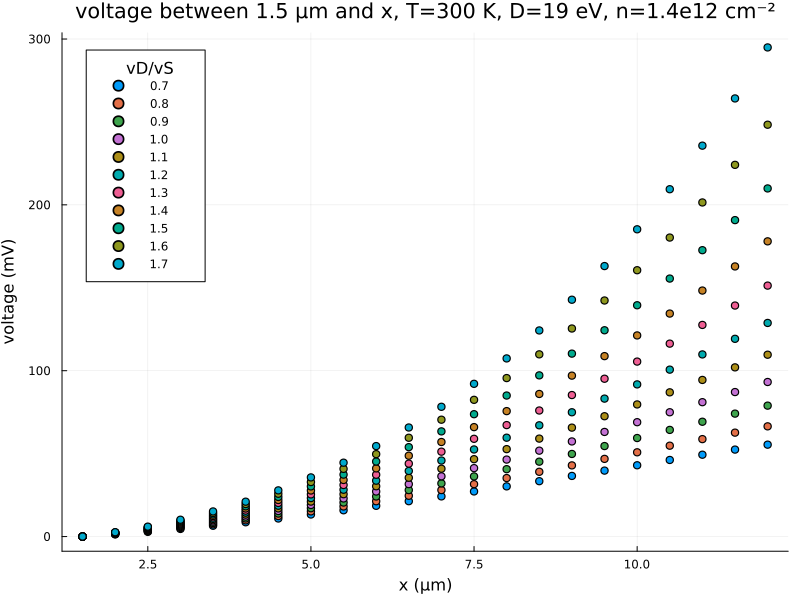

In [38]:
p13 = scatter(x_vals_μm, ([eachrow(Vs)...].*1000)[plot_indices], labels=hcat(s_vals[plot_indices]...))
p13 = plot!(xlabel = "x (μm)", ylabel = "voltage (mV)", title = "voltage between 1.5 μm and x, T=300 K, D=19 eV, n=1.4e12 cm⁻²", legendtitle="vD/vS")
p13 = plot!(size=(800,600))

In [39]:
savefig(p13, "./figs/D_19_eV/300K/voltage_vs_x.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\voltage_vs_x.png"

In [40]:
currents = Float64[]
for s in s_vals
    push!(currents, abs(drift_velocity_to_current(n, s)))
end

In [41]:
Rs = resistance_matrix(Vs, currents)

61×22 Matrix{Float64}:
 NaN    Inf      Inf       Inf       Inf      …   Inf          Inf
   0.0  16.5118  34.8544   54.7455   75.9407     454.215      471.578
   0.0  15.8958  33.673    53.0679   73.8501     460.156      478.813
   0.0  15.2659  32.4806   51.397    71.7971     468.498      488.781
   0.0  14.6876  31.3951   49.892    69.9739     479.404      501.591
   0.0  14.1663  30.425    48.5638   68.3925  …  493.105      517.508
   0.0  13.6983  29.5631   47.4011   67.0382     509.874      536.862
   0.0  13.2793  28.8008   46.392    65.8961     530.109      560.13
   0.0  12.9034  28.1265   45.5191   64.9442     554.233      587.833
   0.0  12.5666  27.5325   44.7718   64.1695     582.822      620.673
   ⋮                                          ⋱    ⋮          
   0.0  12.0786  36.2286   81.2368  162.353        1.60334e6    2.84854e6
   0.0  12.229   37.0433   83.936   169.626        2.10056e6    3.78779e6
   0.0  12.385   37.8926   86.7749  177.353        2.75702e6    5.0460

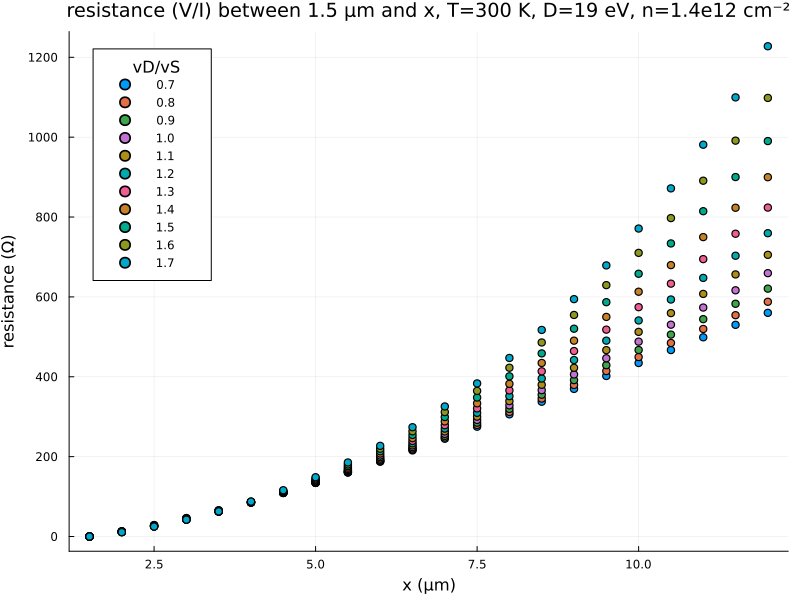

In [42]:
p14 = scatter(x_vals_μm, ([eachrow(Rs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))
p14 = plot!(xlabel = "x (μm)", ylabel = "resistance (Ω)", title = "resistance (V/I) between 1.5 μm and x, T=300 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
p14 = plot!(size=(800,600))

In [43]:
dVdIs = differential_resistivity_matrix(Vs, currents)

61×22 Matrix{Float64}:
 NaN    NaN        NaN       NaN       NaN       …  NaN          NaN
   0.0   15.7405    33.3909   52.6828   73.3819     458.819      477.287
   0.0   14.643     31.2937   49.7227   69.7253     475.64       497.383
   0.0   13.4795    29.1172   46.7162   66.0978     498.653      524.369
   0.0   12.5168    27.3416   44.3141   63.2857     530.015      560.598
   0.0   11.7196    25.8991   42.4194   61.1667  …  570.814      607.403
   0.0   11.062     24.7405   40.9623   59.6549     622.62       666.686
   0.0   10.5189    23.817    39.8731   58.6623     687.309      740.746
   0.0   10.0721    23.0935   39.1014   58.1264     767.316      832.572
   0.0    9.70755   22.5434   38.6102   58.0033     865.871      946.132
   ⋮                                             ⋱    ⋮          
   0.0   19.7978    77.8374  218.429   530.074        2.43998e7    4.56484e7
   0.0   20.3525    81.1571  230.765   567.332        3.27528e7    6.21815e7
   0.0   20.9496    84.7171  24

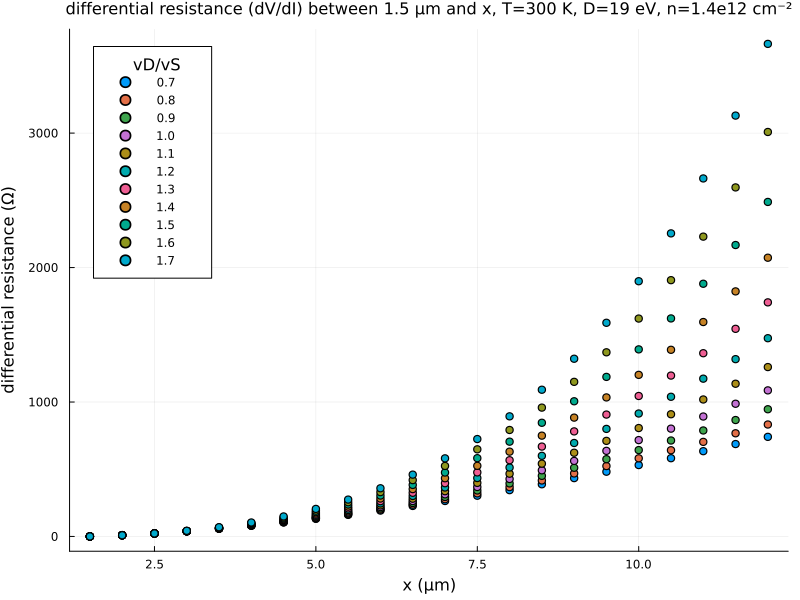

In [44]:
p15 = scatter(x_vals_μm, ([eachrow(dVdIs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))
p15 = plot!(xlabel = "x (μm)", ylabel = "differential resistance (Ω)", title = "differential resistance (dV/dI) between 1.5 μm and x, T=300 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=11, legendtitle="vD/vS")
p15 = plot!(size=(800,600))

adding exponential fits to T=300K plots

In [45]:
R_fit_params = Matrix{Float64}(undef,0,2)
R_fit_stdev = Matrix{Float64}(undef,0,2)
for (i,row) in enumerate(eachrow(Rs))
    if isnan(row[1])
        R_fit_params = vcat(R_fit_params, [NaN,NaN]')
        R_fit_stdev = vcat(R_fit_stdev, [NaN,NaN]')
        continue
    end
    fit = curve_fit(model, x_vals_μm, row, [100.0, 3.0])
    R_fit_params = vcat(R_fit_params, fit.param')
    R_fit_stdev = vcat(R_fit_stdev, standard_errors(fit)')
end

In [46]:
dVdI_fit_params = Matrix{Float64}(undef,0,2)
dVdI_fit_stdev = Matrix{Float64}(undef,0,2)
for (i,row) in enumerate(eachrow(dVdIs))
    if isnan(row[1])
        dVdI_fit_params = vcat(dVdI_fit_params, [NaN,NaN]')
        dVdI_fit_stdev = vcat(dVdI_fit_stdev, [NaN,NaN]')
        continue
    end
    fit = curve_fit(model, x_vals_μm, row, [100.0, 4.0])
    dVdI_fit_params = vcat(dVdI_fit_params, fit.param')
    dVdI_fit_stdev = vcat(dVdI_fit_stdev, standard_errors(fit)')
end

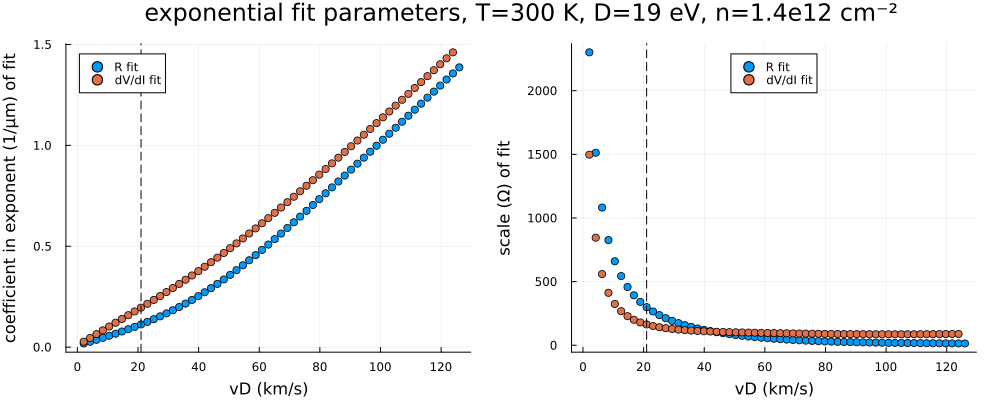

In [47]:
p16 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,2], label = "R fit")
p16 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,2], label = "dV/dI fit")
p16 = vline!([21], linestyle=:dash, color=:black, label=:none)
p16 = plot!(xlabel="vD (km/s)", ylabel="coefficient in exponent (1/μm) of fit")
p16 = plot!(legend=:topleft)

p17 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,1], label = "R fit")
p17 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,1], label = "dV/dI fit")
p17 = vline!([21], linestyle=:dash, color=:black, label=:none)
p17 = plot!(xlabel="vD (km/s)", ylabel="scale (Ω) of fit")
p17 = plot!(legend=:top)

p18 = plot(p16, p17, layout = 2)
p18 = plot!(plot_title="exponential fit parameters, T=300 K, D=19 eV, n=1.4e12 cm⁻²")
p18 = plot!(size=(1000,400), margin=4*Plots.mm)

In [48]:
savefig(p18, "./figs/D_19_eV/300K/fit_params.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\fit_params.png"

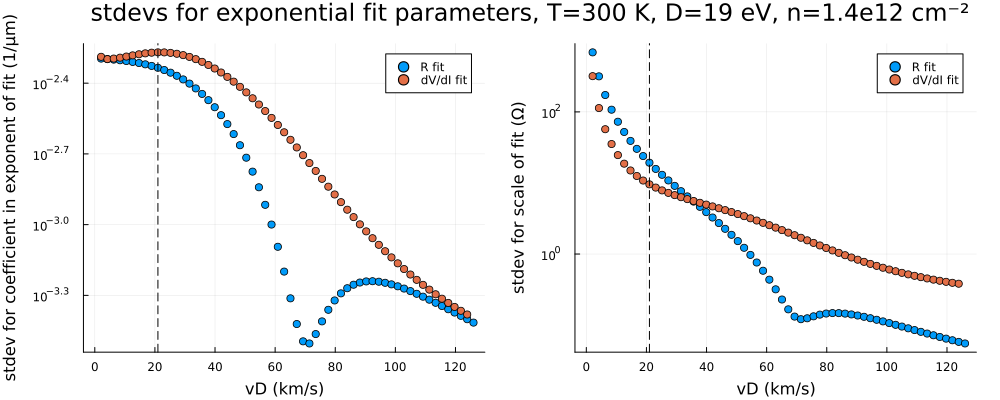

In [49]:
p19 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_stdev[:,2], label = "R fit")
p19 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_stdev[:,2], label = "dV/dI fit")
p19 = vline!([21], linestyle=:dash, color=:black, label=:none)
p19 = plot!(yaxis=:log)
p19 = plot!(xlabel="vD (km/s)", ylabel="stdev for coefficient in exponent of fit (1/μm)")

p20 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_stdev[:,1], label = "R fit")
p20 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_stdev[:,1], label = "dV/dI fit")
p20 = vline!([21], linestyle=:dash, color=:black, label=:none)
p20 = plot!(yaxis=:log)
p20 = plot!(xlabel="vD (km/s)", ylabel="stdev for scale of fit (Ω)")

p21 = plot(p19, p20, layout = 2)
p21 = plot!(plot_title="stdevs for exponential fit parameters, T=300 K, D=19 eV, n=1.4e12 cm⁻²")
p21 = plot!(size=(1000,400), margin=4*Plots.mm)

In [50]:
savefig(p21, "./figs/D_19_eV/300K/fit_stdevs.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\fit_stdevs.png"

In [51]:
x_finer_grid_μm = range(x_vals_μm[1], x_vals_μm[end], length=1000)

1.5:0.010510510510510511:12.0

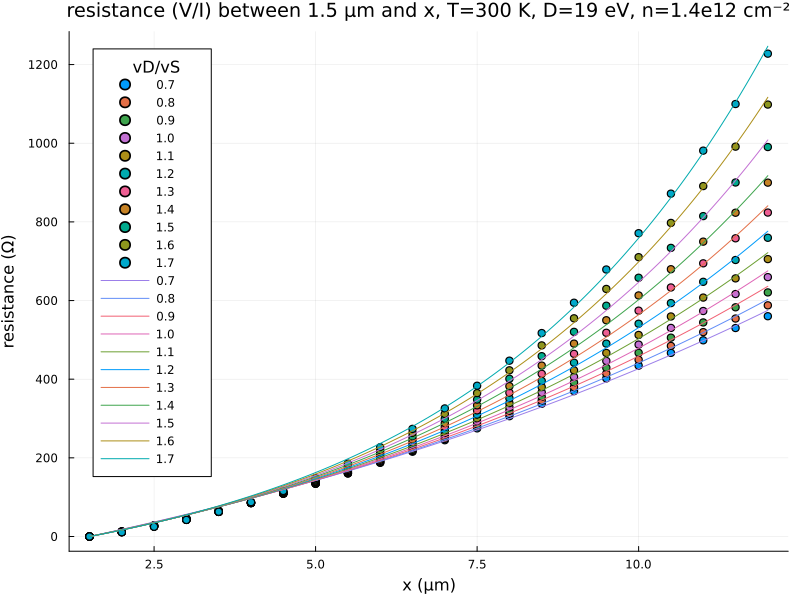

In [52]:
p22 = scatter(x_vals_μm, ([eachrow(Rs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

p22 = plot!(x_finer_grid_μm, [x -> model(x, R_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

p22 = plot!(xlabel = "x (μm)", ylabel = "resistance (Ω)", title = "resistance (V/I) between 1.5 μm and x, T=300 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=13, legendtitle="vD/vS")
p22 = plot!(size=(800,600))

In [53]:
savefig(p22, "./figs/D_19_eV/300K/resistance_vs_x_with_fit.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\resistance_vs_x_with_fit.png"

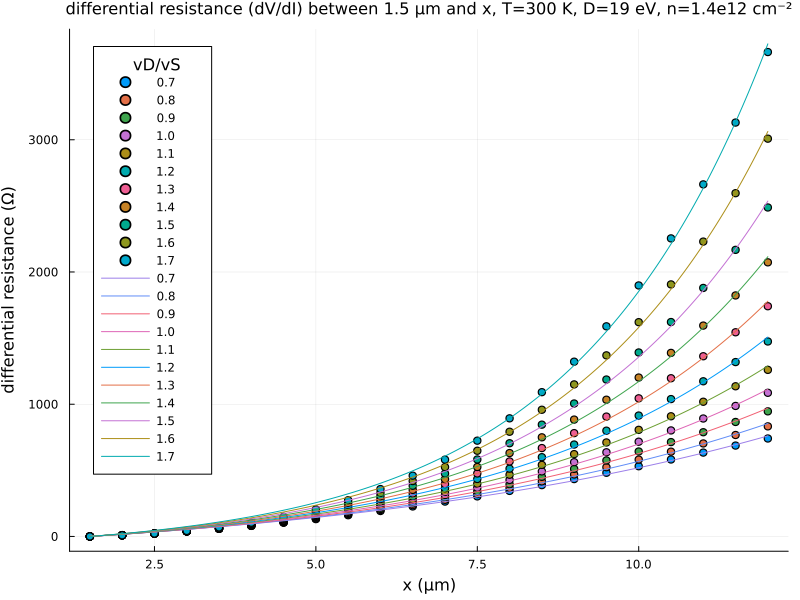

In [54]:
p23 = scatter(x_vals_μm, ([eachrow(dVdIs)...])[plot_indices], labels=hcat(s_vals[plot_indices]...))

p23 = plot!(x_finer_grid_μm, [x -> model(x, dVdI_fit_params[i,:]) for i=plot_indices], labels=hcat(s_vals[plot_indices]...))

p23 = plot!(xlabel = "x (μm)", ylabel = "differential resistance (Ω)", title = "differential resistance (dV/dI) between 1.5 μm and x, T=300 K, D=19 eV, n=1.4e12 cm⁻²", titlefontsize=11, legendtitle="vD/vS")
p23 = plot!(size=(800,600))

In [55]:
savefig(p23, "./figs/D_19_eV/300K/dVdI_vs_x_with_fit.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\dVdI_vs_x_with_fit.png"

In [56]:
function load_γs_df_300K(n,s)
    T = 300.0
    T_str = @sprintf("%1.2e",T)
    n_str = @sprintf("%1.2e",n)
    s_str = @sprintf("%1.2e",s)
    return DataFrame(CSV.File("./amp_rates_csv/D_19_eV/300K/" * replace("T="*T_str*"_n="*n_str*"_s="*s_str, "."=>"-") * ".csv"))
end

function max_Gamma_amp_over_vs_300K(s)
    γs_df = load_γs_df_300K(n,s)
    Γamps = γs_df."Γamp"
    max_Γamp = maximum(Γamps) # this is in 1/s
    vS = r_LA*vF # this is in cm/s
    # max_Γamp / vS would be in 1/cm, so we need to multiply by 1 cm / 10^4 μm to get to 1/μm.
    return (max_Γamp / vS) * 1e-4
end

max_Gamma_amp_over_vs_300K (generic function with 1 method)

In [57]:
expected_exponents = [max_Gamma_amp_over_vs_300K(s) for s in s_vals]

61-element Vector{Float64}:
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004761904761904762
 -0.004757709651752485
  ⋮
  1.2334227054015001
  1.2631128052767304
  1.2928110023132606
  1.3225171663920148
  1.3522311657293786
  1.3819528668697738
  1.4116821346786108
  1.441418832335496
  1.4711628213277999

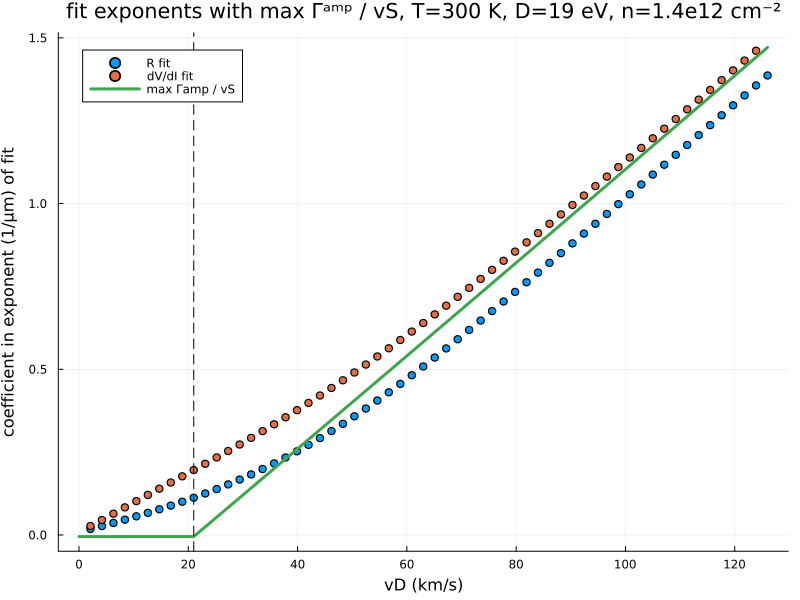

In [58]:
p24 = scatter(s_vals.*(r_LA*vF*1e-5), R_fit_params[:,2], label = "R fit")
p24 = scatter!(s_vals.*(r_LA*vF*1e-5), dVdI_fit_params[:,2], label = "dV/dI fit")
p24 = plot!(s_vals.*(r_LA*vF*1e-5), expected_exponents, label = "max Γamp / vS", linewidth=3)
p24 = vline!([21], linestyle=:dash, color=:black, label=:none)
p24 = plot!(xlabel="vD (km/s)", ylabel="coefficient in exponent (1/μm) of fit")
p24 = plot!(title="fit exponents with max Γᵃᵐᵖ / vS, T=300 K, D=19 eV, n=1.4e12 cm⁻²", legend=:topleft)
p24 = plot!(size=(800,600))

In [59]:
savefig(p24, "./figs/D_19_eV/300K/fit_exponent_with_expectation.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\300K\\fit_exponent_with_expectation.png"

now, $\Gamma^\textrm{amp}_{\bf q}$ plots

In [60]:
function load_γs_df_vary_n(n,s)
    T = 2.0
    T_str = @sprintf("%1.2e",T)
    n_str = @sprintf("%1.2e",n)
    s_str = @sprintf("%1.2e",s)
    return DataFrame(CSV.File("./amp_rates_csv/D_19_eV/vary_n/" * replace("T="*T_str*"_n="*n_str*"_s="*s_str, "."=>"-") * ".csv"))
end

# function max_Gamma_amp_over_vs_from_df(γs_df)
#     Γamps = γs_df."Γamp"
#     max_Γamp = maximum(Γamps) # this is in 1/s
#     vS = r_LA*vF # this is in cm/s
#     # max_Γamp / vS would be in 1/cm, so we need to multiply by 1 cm / 10^4 μm to get to 1/μm.
#     return (max_Γamp / vS) * 1e-4
# end

function max_Γamp_df(n_vals, s_vals)
    # note that the first column, vD, is in cm/s, and the Γamps are in 1/s.
    T = 2.0 # K
    vS = r_LA*vF # this is in cm/s

    max_Γamp_df = DataFrame()
    max_Γamp_df."vD" = s_vals .* vS

    for n in n_vals
        current_n_array = Float64[]
        for s in s_vals
            γs_df = load_γs_df_vary_n(n,s)
            Γamps = γs_df."Γamp"
            max_Γamp = maximum(Γamps) # this is in 1/s
            push!(current_n_array, max_Γamp)
        end
        n_str = @sprintf("%1.2e",n)
        max_Γamp_df[!, Symbol(n)] = current_n_array
    end
    
    return max_Γamp_df
end

max_Γamp_df (generic function with 1 method)

In [61]:
n_vals = range(0.0, 3.0e12, length=21)[2:end] # cm^-2
s_vals = [0.9, 1.1, 2.0, 5.0, 10.0]

max_Γamps = max_Γamp_df(n_vals, s_vals)

Row,vD,1.5e11,3.0e11,4.5e11,6.0e11,7.5e11,9.0e11,1.05e12,1.2e12,1.35e12,1.5e12,1.65e12,1.8e12,1.95e12,2.1e12,2.25e12,2.4e12,2.55e12,2.7e12,2.85e12,3.0e12
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.89e6,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8,-1.0e8
2,2.31e6,-3.08032e7,3.8299e7,1.07346e8,1.76365e8,2.45366e8,3.10796e8,3.78537e8,4.46283e8,5.14092e8,5.87688e8,6.56117e8,7.28671e8,7.97679e8,8.66692e8,9.35712e8,1.00474e9,1.07378e9,1.14284e9,1.2119e9,1.28098e9
3,4.2e6,5.92691e8,1.28569e9,1.97833e9,2.67077e9,3.3631e9,4.05535e9,4.74753e9,5.43966e9,6.13176e9,6.82381e9,7.51585e9,8.20785e9,8.89982e9,9.59179e9,1.02837e10,1.09757e10,1.16676e10,1.23595e10,1.30514e10,1.37433e10
4,1.05e7,2.67851e9,5.45874e9,8.23775e9,1.10161e10,1.37941e10,1.65719e10,1.93494e10,2.21267e10,2.49039e10,2.7681e10,3.0458e10,3.32349e10,3.60118e10,3.87886e10,4.15653e10,4.4342e10,4.71186e10,4.98952e10,5.26717e10,5.54482e10
5,2.1e7,6.16444e9,1.24246e10,1.86814e10,2.49366e10,3.11907e10,3.74441e10,4.36968e10,4.99492e10,5.62011e10,6.24656e10,6.87041e10,7.49553e10,8.12063e10,8.7457e10,9.37077e10,9.99581e10,1.06208e11,1.12459e11,1.18709e11,1.24959e11


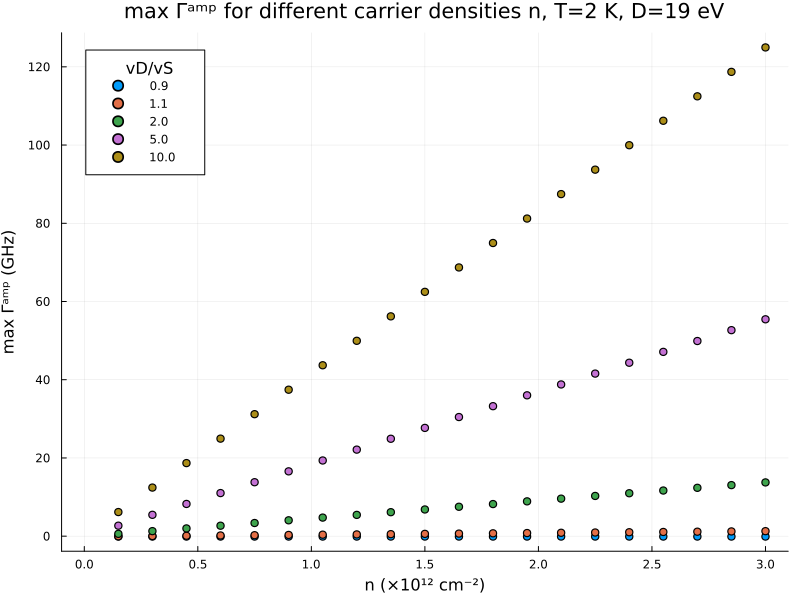

In [62]:
p25 = plot()
for (i,s) in enumerate(s_vals)
    # p25 = plot!(n_vals ./ 1e12, collect(max_Γamps[i,2:end]) ./ 1e9, label=s, linewidth=2)
    p25 = scatter!(n_vals ./ 1e12, collect(max_Γamps[i,2:end]) ./ 1e9, label=s)
end
p25 = plot!(xlabel="n (×10¹² cm⁻²)", ylabel="max Γᵃᵐᵖ (GHz)", title = "max Γᵃᵐᵖ for different carrier densities n, T=2 K, D=19 eV", legendtitle="vD/vS")
p25 = plot!(xlims=(-0.1,3.1), xticks=0.0:0.5:3.0)
p25 = plot!(size=(800,600))

In [63]:
savefig(p25, "./figs/D_19_eV/Gamma_amps/max_Gamma_amp_versus_n.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\max_Gamma_amp_versus_n.png"

$\Gamma^{\textrm{amp}}$ plots for $v_\textrm{D}/v_\textrm{s} = 0.9$, $1.1$, $2$, $5$

T = 2 K

In [64]:
function γs_df_to_Γamp_dict(γs_df)
    d = Dict{Tuple{Float64,Float64},Float64}()
    for row in eachrow(γs_df)
        qx,qy = row[1],row[2]
        Γamp = row[6]
        d[qx,qy] = Γamp
    end
    return d
end

γs_df_to_Γamp_dict (generic function with 1 method)

In [65]:
function Γamp_interp(γs_dict)
    qx_dict_vec = union(sort([key[1] for key in keys(γs_dict)]))
    qx_dict_range = range(qx_dict_vec[1],qx_dict_vec[end],length=size(qx_dict_vec,1))
    qy_dict_vec = union(sort([key[2] for key in keys(γs_dict)]))
    qy_dict_range = range(qy_dict_vec[1],qy_dict_vec[end],length=size(qy_dict_vec,1))
    Γamp_vals = [γs_dict[qx,qy] for qx in qx_dict_range, qy in qy_dict_range]
    Γamp_interp = linear_interpolation((qx_dict_range,qy_dict_range), Γamp_vals)
    return Γamp_interp
end

Γamp_interp (generic function with 1 method)

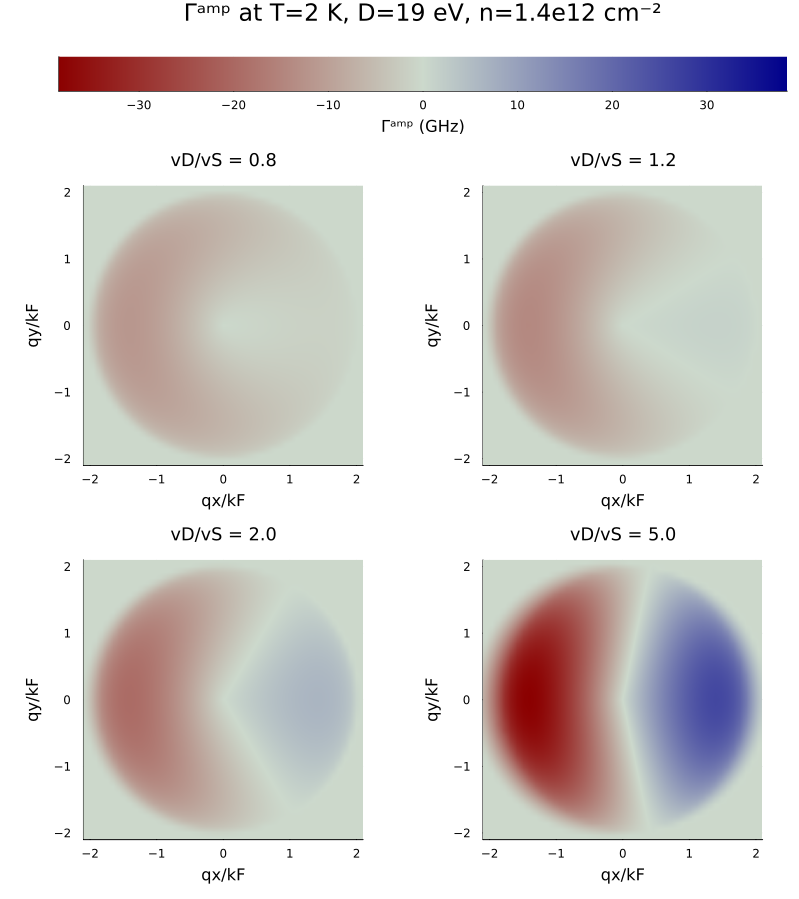

In [82]:
n::Float64 = 1.4e12



s1::Float64 = 0.8
γs1 = load_γs_df_2K(n,s1)
Γamps1 = γs_df_to_Γamp_dict(γs1)
interp1 = Γamp_interp(Γamps1)

s2::Float64 = 1.2
γs2 = load_γs_df_2K(n,s2)
Γamps2 = γs_df_to_Γamp_dict(γs2)
interp2 = Γamp_interp(Γamps2)

s3::Float64 = 2.0
γs3 = load_γs_df_2K(n,s3)
Γamps3 = γs_df_to_Γamp_dict(γs3)
interp3 = Γamp_interp(Γamps3)

s4::Float64 = 5.0
γs4 = load_γs_df_2K(n,s4)
Γamps4 = γs_df_to_Γamp_dict(γs4)
interp4 = Γamp_interp(Γamps4)



maxΓ1 = maximum(abs.(values(Γamps1))) * 1e-9
maxΓ2 = maximum(abs.(values(Γamps2))) * 1e-9
maxΓ3 = maximum(abs.(values(Γamps3))) * 1e-9
maxΓ4 = maximum(abs.(values(Γamps4))) * 1e-9
maxΓ = max(maxΓ1,maxΓ2,maxΓ3,maxΓ4)



# qvals = hcat(collect.(collect(keys(Γamps1)))...)
# qx_plot_vals = range(minimum(qvals[1,:]), maximum(qvals[1,:]), length=1000)
# qy_plot_vals = range(minimum(qvals[2,:]), maximum(qvals[2,:]), length=1000)
qx_plot_vals = range(-2.1,2.1,length=1000)
qy_plot_vals = range(-2.1,2.1,length=1000)


p26 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp1(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p26 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p26 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s1), titlefontsize=12, colorbar=false)

p27 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp2(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p27 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p27 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s2), titlefontsize=12, colorbar=false)

p28 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp3(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p28 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p28 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s3), titlefontsize=12, colorbar=false)

p29 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp4(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p29 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p29 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s4), titlefontsize=12, colorbar=false)



p30 = heatmap(range(-maxΓ,maxΓ,length=1000),[1], (x,y)->x, cmap=:redsblues, clims=(-maxΓ,maxΓ), yticks=:none, xlabel="Γᵃᵐᵖ (GHz)", colorbar=false)



p31 = plot(p30,p26,p27,p28,p29, layout=@layout [ a{0.05h}; grid(2,2) ])
p31 = plot!(plot_title="Γᵃᵐᵖ at T=2 K, D=19 eV, n=1.4e12 cm⁻²")
p31 = plot!(size=(800,900))

In [83]:
savefig(p31, "./figs/D_19_eV/Gamma_amps/Gamma_amps_2K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\Gamma_amps_2K.png"

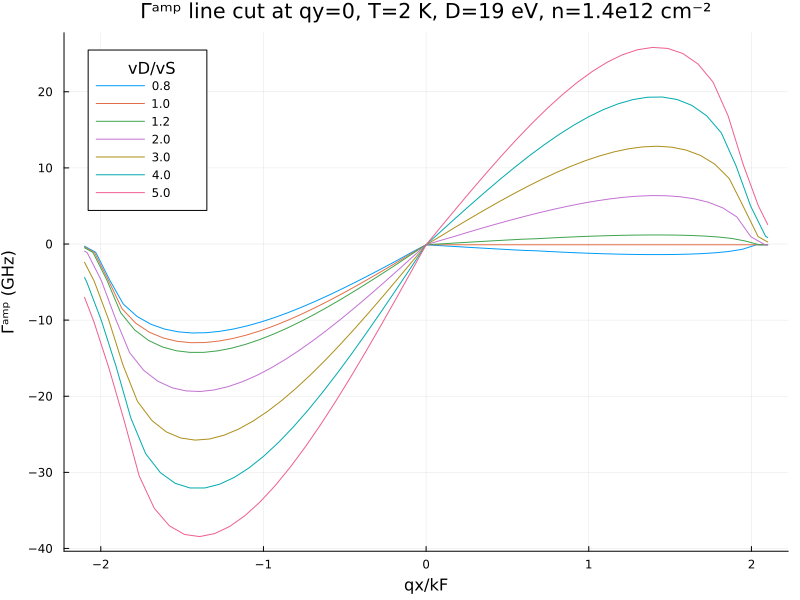

In [84]:
s_vals = [0.8,1.0,1.2,2.0,3.0,4.0,5.0]
n = 1.4e12
T = 2.0

qx_plot_vals = range(-2.1,2.1,length=1000)

p32 = plot()

for s in s_vals
    γs = load_γs_df_2K(n,s)
    Γamps = γs_df_to_Γamp_dict(γs)
    interp = Γamp_interp(Γamps)
    p32 = plot!(qx_plot_vals, interp.(qx_plot_vals, 0.0) .* 1e-9, label=s)
end

p32 = plot!(xlabel="qx/kF", ylabel="Γᵃᵐᵖ (GHz)", title="Γᵃᵐᵖ line cut at qy=0, T=2 K, D=19 eV, n=1.4e12 cm⁻²", legendtitle="vD/vS")
p32 = plot!(size=(800,600))

In [85]:
savefig(p32, "./figs/D_19_eV/Gamma_amps/Gamma_amp_line_cuts_2K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\Gamma_amp_line_cuts_2K.png"

In [70]:
function max_Γamps_2K(s_vals)
    T = 2.0 # K
    n = 1.4e12 # cm^-2
    maxΓs = Float64[]
    for s in s_vals
        γs_df = load_γs_df_2K(n,s)
        Γamps = γs_df."Γamp"
        max_Γamp = maximum(Γamps) # this is in 1/s
        push!(maxΓs, max_Γamp)
    end
    return maxΓs
end

max_Γamps_2K (generic function with 1 method)

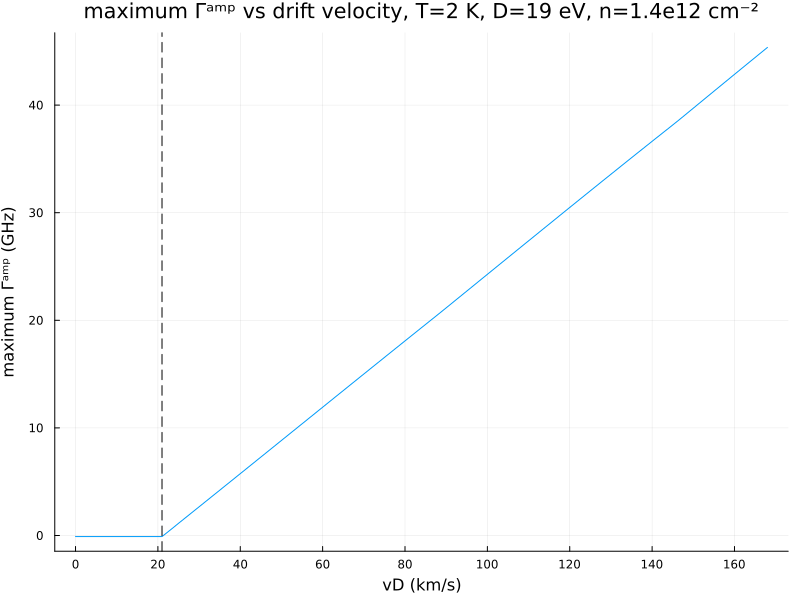

In [86]:
s_vals = 0.0:0.1:8.0

maxΓs = max_Γamps_2K(s_vals)

p33 = plot(s_vals.*(r_LA*vF*1e-5), maxΓs.*1e-9)
p33 = vline!([21], linestyle=:dash, color=:black)
p33 = plot!(xlabel="vD (km/s)", ylabel="maximum Γᵃᵐᵖ (GHz)", title="maximum Γᵃᵐᵖ vs drift velocity, T=2 K, D=19 eV, n=1.4e12 cm⁻²", legend=:none, xticks=0:20:160)
p33 = plot!(size=(800,600))

In [87]:
savefig(p33, "./figs/D_19_eV/Gamma_amps/max_Gamma_amp_vs_vD_2K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\max_Gamma_amp_vs_vD_2K.png"

T = 300 K

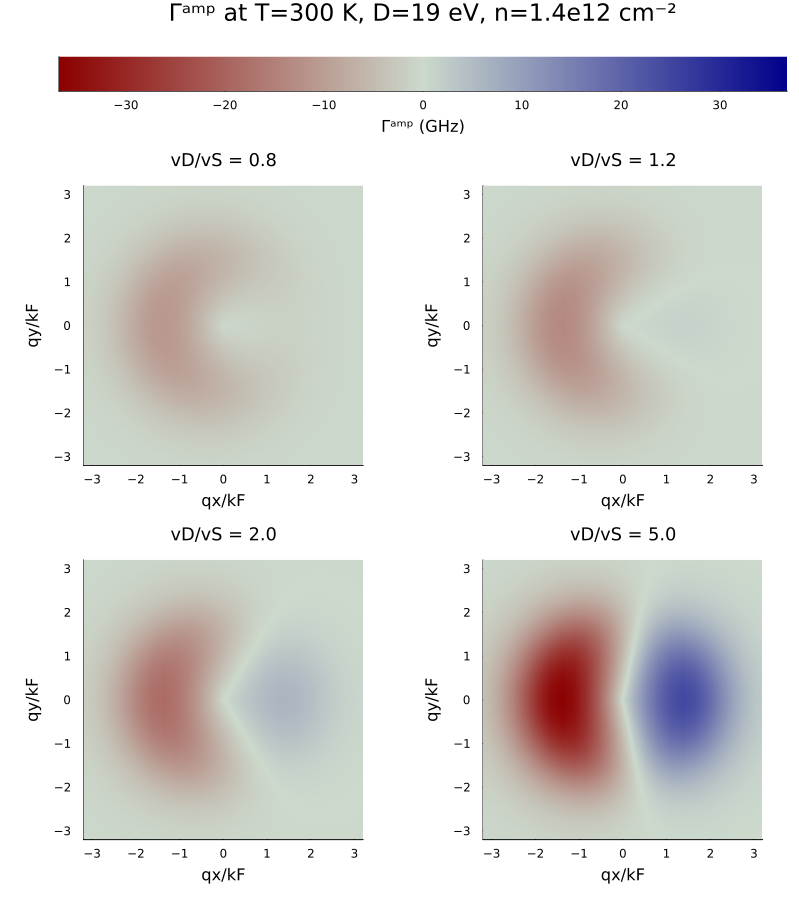

In [88]:
n::Float64 = 1.4e12



s1::Float64 = 0.8
γs1 = load_γs_df_300K(n,s1)
Γamps1 = γs_df_to_Γamp_dict(γs1)
interp1 = Γamp_interp(Γamps1)

s2::Float64 = 1.2
γs2 = load_γs_df_300K(n,s2)
Γamps2 = γs_df_to_Γamp_dict(γs2)
interp2 = Γamp_interp(Γamps2)

s3::Float64 = 2.0
γs3 = load_γs_df_300K(n,s3)
Γamps3 = γs_df_to_Γamp_dict(γs3)
interp3 = Γamp_interp(Γamps3)

s4::Float64 = 5.0
γs4 = load_γs_df_300K(n,s4)
Γamps4 = γs_df_to_Γamp_dict(γs4)
interp4 = Γamp_interp(Γamps4)



maxΓ1 = maximum(abs.(values(Γamps1))) * 1e-9
maxΓ2 = maximum(abs.(values(Γamps2))) * 1e-9
maxΓ3 = maximum(abs.(values(Γamps3))) * 1e-9
maxΓ4 = maximum(abs.(values(Γamps4))) * 1e-9
maxΓ = max(maxΓ1,maxΓ2,maxΓ3,maxΓ4)



# qvals = hcat(collect.(collect(keys(Γamps1)))...)
# qx_plot_vals = range(minimum(qvals[1,:]), maximum(qvals[1,:]), length=1000)
# qy_plot_vals = range(minimum(qvals[2,:]), maximum(qvals[2,:]), length=1000)
qx_plot_vals = range(-3.2,3.2,length=1000)
qy_plot_vals = range(-3.2,3.2,length=1000)



p34 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp1(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p34 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p34 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s1), titlefontsize=12, colorbar=false)

p35 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp2(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p35 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p35 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s2), titlefontsize=12, colorbar=false)

p36 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp3(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p36 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p36 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s3), titlefontsize=12, colorbar=false)

p37 = heatmap(qx_plot_vals, qy_plot_vals, (qx,qy) -> interp4(qx,qy) * 1e-9, cmap=:redsblues, clims=(-maxΓ,maxΓ))
p37 = plot!(aspect_ratio=:equal, xlims=(minimum(qx_plot_vals),maximum(qx_plot_vals)), ylims=(minimum(qy_plot_vals),maximum(qy_plot_vals)))
p37 = plot!(xlabel = "qx/kF", ylabel = "qy/kF", title=@sprintf("vD/vS = %1.1f",s4), titlefontsize=12, colorbar=false)



p38 = heatmap(range(-maxΓ,maxΓ,length=1000),[1], (x,y)->x, cmap=:redsblues, clims=(-maxΓ,maxΓ), yticks=:none, xlabel="Γᵃᵐᵖ (GHz)", colorbar=false)



p39 = plot(p38,p34,p35,p36,p37, layout=@layout [ a{0.05h}; grid(2,2) ])
p39 = plot!(plot_title="Γᵃᵐᵖ at T=300 K, D=19 eV, n=1.4e12 cm⁻²")
p39 = plot!(size=(800,900))

In [89]:
savefig(p39, "./figs/D_19_eV/Gamma_amps/Gamma_amps_300K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\Gamma_amps_300K.png"

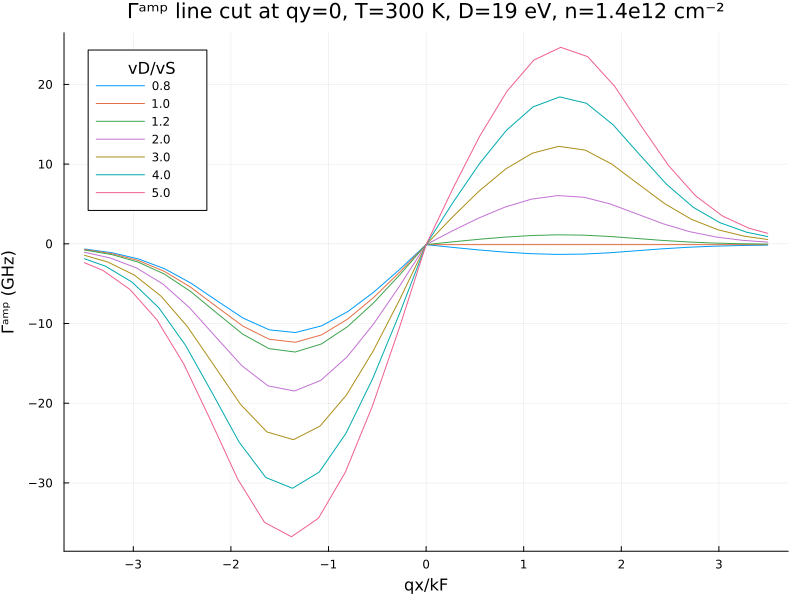

In [90]:
s_vals = [0.8,1.0,1.2,2.0,3.0,4.0,5.0]
n = 1.4e12
T = 300.0

qx_plot_vals = range(-3.5,3.5,length=1000)

p40 = plot()

for s in s_vals
    γs = load_γs_df_300K(n,s)
    Γamps = γs_df_to_Γamp_dict(γs)
    interp = Γamp_interp(Γamps)
    p40 = plot!(qx_plot_vals, interp.(qx_plot_vals, 0.0) .* 1e-9, label=s)
end

p40 = plot!(xlabel="qx/kF", ylabel="Γᵃᵐᵖ (GHz)", title="Γᵃᵐᵖ line cut at qy=0, T=300 K, D=19 eV, n=1.4e12 cm⁻²", legendtitle="vD/vS")
p40 = plot!(size=(800,600))

In [91]:
savefig(p40, "./figs/D_19_eV/Gamma_amps/Gamma_amp_line_cuts_300K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\Gamma_amp_line_cuts_300K.png"

In [77]:
function max_Γamps_300K(s_vals)
    T = 300.0 # K
    n = 1.4e12 # cm^-2
    maxΓs = Float64[]
    for s in s_vals
        γs_df = load_γs_df_300K(n,s)
        Γamps = γs_df."Γamp"
        max_Γamp = maximum(Γamps) # this is in 1/s
        push!(maxΓs, max_Γamp)
    end
    return maxΓs
end

max_Γamps_300K (generic function with 1 method)

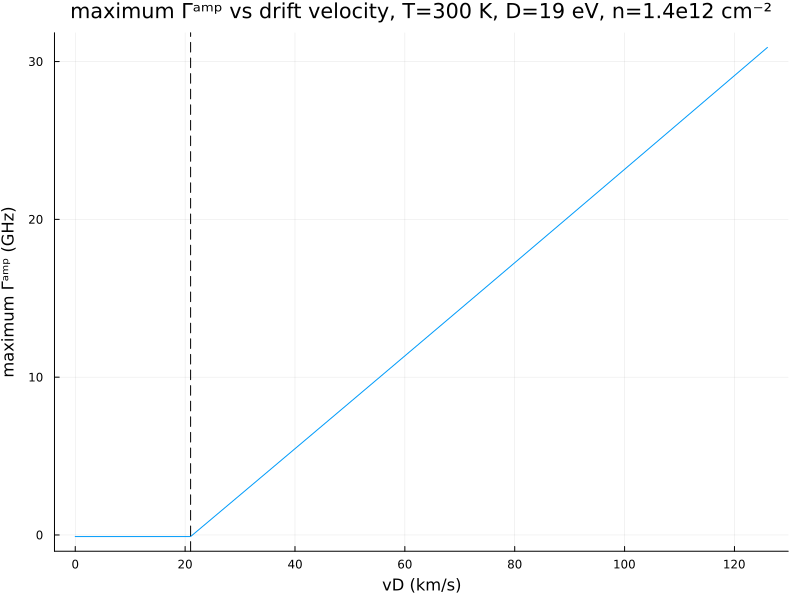

In [92]:
s_vals = 0.0:0.1:6.0

maxΓs = max_Γamps_300K(s_vals)

p41 = plot(s_vals.*(r_LA*vF*1e-5), maxΓs.*1e-9)
p41 = vline!([21], linestyle=:dash, color=:black)
p41 = plot!(xlabel="vD (km/s)", ylabel="maximum Γᵃᵐᵖ (GHz)", title="maximum Γᵃᵐᵖ vs drift velocity, T=300 K, D=19 eV, n=1.4e12 cm⁻²", legend=:none, xticks=0:20:140)
p41 = plot!(size=(800,600))

In [93]:
savefig(p41, "./figs/D_19_eV/Gamma_amps/max_Gamma_amp_vs_vD_300K.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\max_Gamma_amp_vs_vD_300K.png"

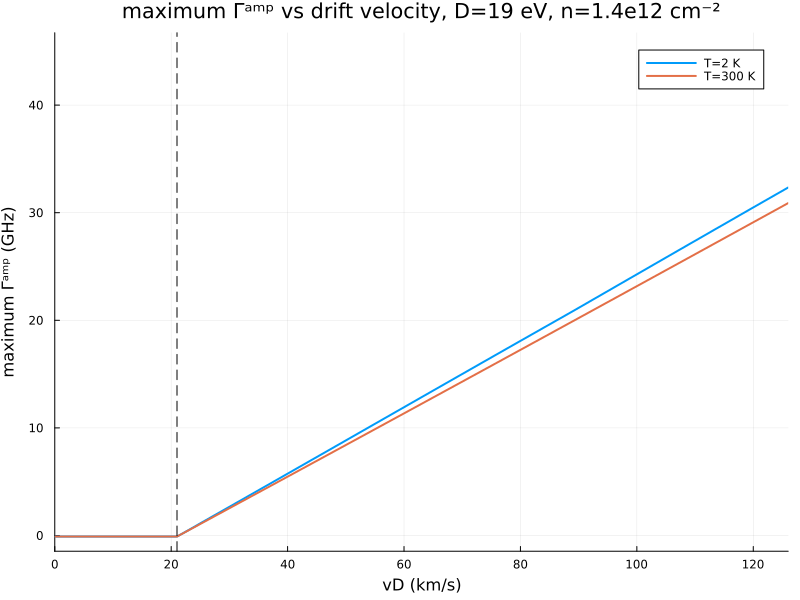

In [96]:
s_vals_2K = 0.0:0.1:8.0
maxΓs_2K = max_Γamps_2K(s_vals_2K)

s_vals_300K = 0.0:0.1:6.0
maxΓs_300K = max_Γamps_300K(s_vals_300K)

p42 = plot(s_vals_2K.*(r_LA*vF*1e-5), maxΓs_2K.*1e-9, label="T=2 K", linewidth=2)
p42 = plot!(s_vals_300K.*(r_LA*vF*1e-5), maxΓs_300K.*1e-9, label="T=300 K", linewidth=2)
p42 = vline!([21], linestyle=:dash, color=:black, label=:none)
p42 = plot!(xlabel="vD (km/s)", ylabel="maximum Γᵃᵐᵖ (GHz)", title="maximum Γᵃᵐᵖ vs drift velocity, D=19 eV, n=1.4e12 cm⁻²", xlims=(0,s_vals_300K[end]*r_LA*vF*1e-5), xticks=0:20:140)
p42 = plot!(size=(800,600))

In [97]:
savefig(p42, "./figs/D_19_eV/Gamma_amps/max_Gamma_amp_vs_vD_combined.png")

"c:\\Users\\eric0\\Documents\\uci\\research ii\\phonon_amp_git_ver\\phonon-amp\\figs\\D_19_eV\\Gamma_amps\\max_Gamma_amp_vs_vD_combined.png"